# Support Vector Machine for Breast Cancer Dataset
SVM is used to find a hyperplane to efficiently divide a dataset into predicatible classes. Hyperplanes could be multi-dimenstional.

The Breast Cancer Dataset contains features computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.

In [6]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn

## 1. Data Acquisition & Preparation

In [7]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()


In [8]:
#Description of the dataset
print(cancer["DESCR"])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [9]:
df_target = pd.DataFrame(cancer["target"], columns=["Cancer"])
df_features= pd.DataFrame(data=cancer["data"], columns=cancer["feature_names"])

df = pd.concat([df_target, df_features], axis=1)

### Exploratory Data Analysis


In [14]:
cancer["feature_names"][0:10]

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension'],
      dtype='<U23')

In [10]:
#check null values
df_boston.isnull().sum()

mean radius                False
mean texture               False
mean perimeter             False
mean area                  False
mean smoothness            False
mean compactness           False
mean concavity             False
mean concave points        False
mean symmetry              False
mean fractal dimension     False
radius error               False
texture error              False
perimeter error            False
area error                 False
smoothness error           False
compactness error          False
concavity error            False
concave points error       False
symmetry error             False
fractal dimension error    False
worst radius               False
worst texture              False
worst perimeter            False
worst area                 False
worst smoothness           False
worst compactness          False
worst concavity            False
worst concave points       False
worst symmetry             False
worst fractal dimension    False
dtype: boo

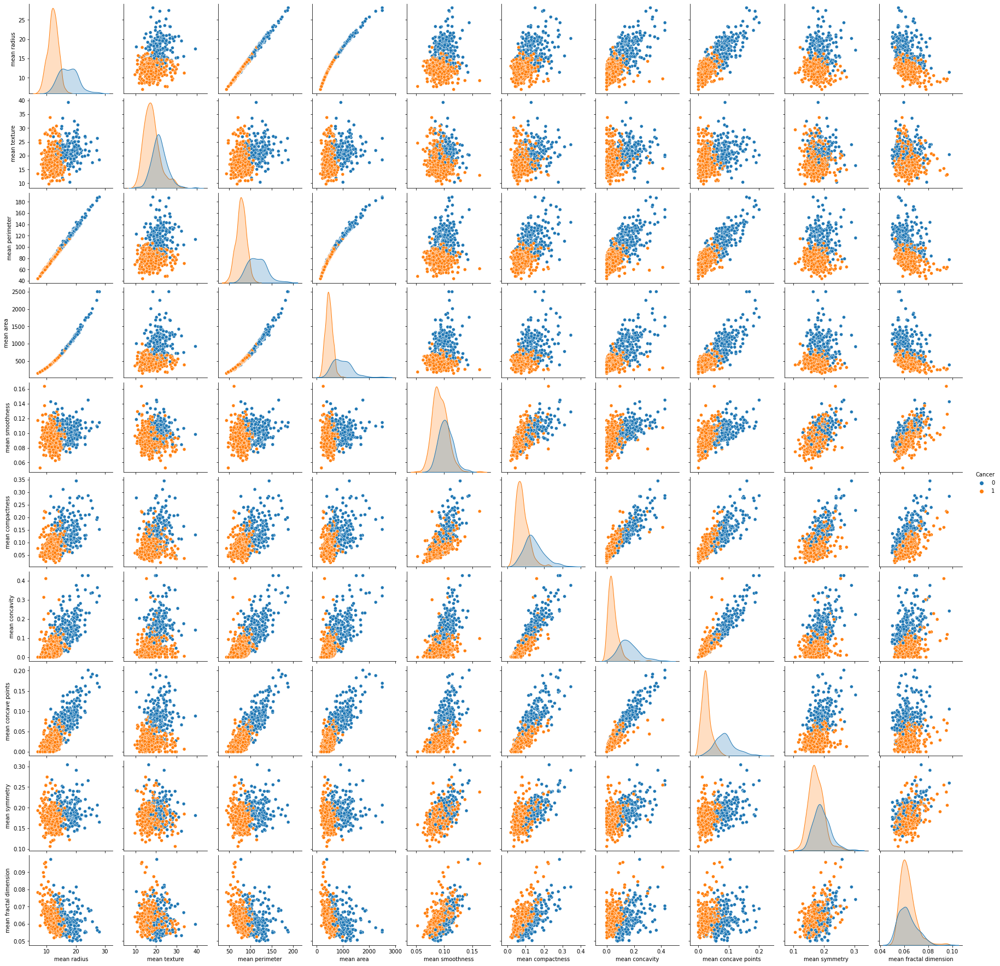

In [16]:
sns.pairplot(df,
    x_vars=cancer["feature_names"][0:10],
    y_vars=cancer["feature_names"][0:10],
    hue="Cancer")


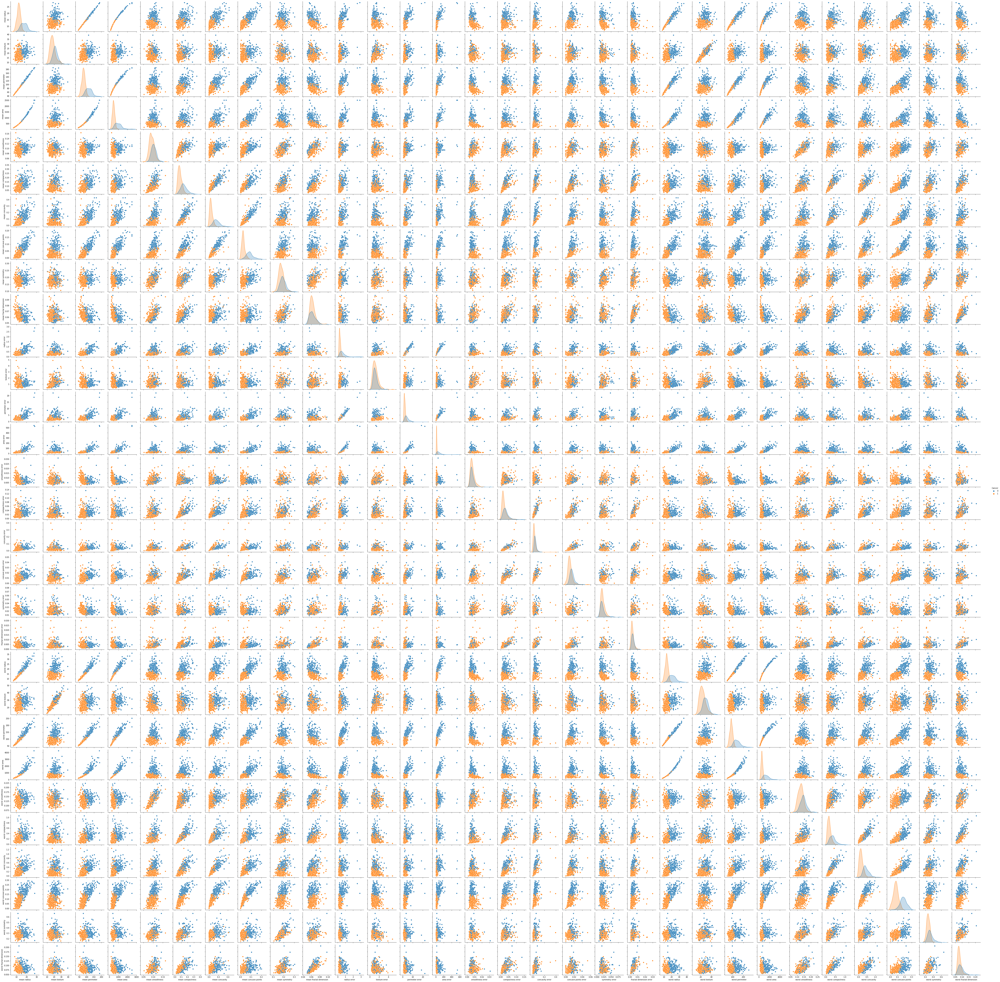

In [17]:
sns.pairplot(df,
    hue="Cancer")


<AxesSubplot:>

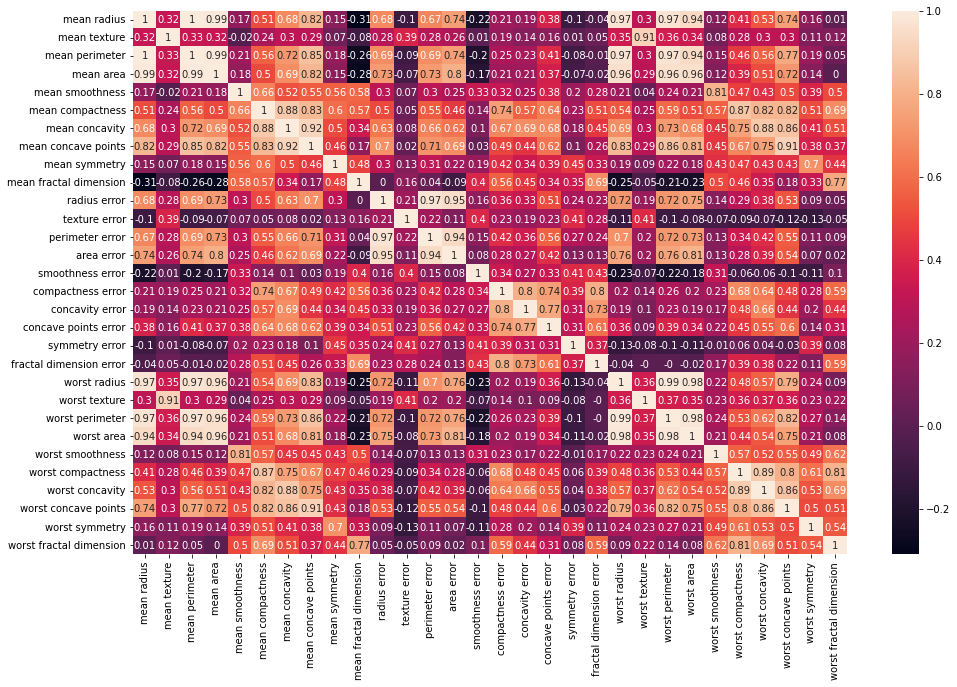

In [11]:
#correlation among data columns
corr = df_features.corr().round(2)
plt.figure(figsize=(16,10))
sns.heatmap(corr, annot=True)

These graphs have show the general demographics of the dataset and the correlation among the columns of the dataset.


## 2. Model Selection
The features of this dataset are many. The cost of misclassifications and the training dataset influence on the ML model are considered.

SVM provides hyperparameters such as C and Gamma that can better determine the model's Variance and Bias.

## 3. Model Building and Training

In [18]:
X = df_features
y = df_target

In [19]:
# split train test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=100)

In [23]:
from sklearn.svm import SVC

model = SVC()


In [24]:
model.fit(X_train, y_train)

c:\users\liwin\appdata\local\programs\python\python39\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


SVC()

## 4. Model Prediction

In [25]:
#predicted results
pred = model.predict(X_test)
pred

array([0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1])

In [32]:
#actual results
print(y_test)

     Cancer
400       0
225       1
321       0
173       1
506       1
..      ...
100       0
7         0
361       1
343       0
466       1

[171 rows x 1 columns]


## 5. Model Evaluation

In [33]:
#loss functions
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [34]:
accuracy_score(y_test, pred)

0.9064327485380117

In [35]:
confusion_matrix(y_test, pred)

array([[ 54,  15],
       [  1, 101]], dtype=int64)

In [36]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.98      0.78      0.87        69
           1       0.87      0.99      0.93       102

    accuracy                           0.91       171
   macro avg       0.93      0.89      0.90       171
weighted avg       0.92      0.91      0.90       171



## 4-5: SVM Model training with different kernels and their evaluation comparisons

In [37]:
model

SVC()

In [38]:
kernels = ["linear","poly","rbf","sigmoid"]

accuracies = []

for k in kernels:
  model = SVC(kernel = k)
  model.fit(X_train,y_train)
  pred = model.predict(X_test)
  accuracies.append(accuracy_score(y_test,pred))

c:\users\liwin\appdata\local\programs\python\python39\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\users\liwin\appdata\local\programs\python\python39\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\users\liwin\appdata\local\programs\python\python39\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\users\liwin\appdata\local\programs\python\python39\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-

In [39]:
pd.DataFrame(data=accuracies, index=kernels,columns=["Accuracy"])

,Accuracy
linear,0.953216
poly,0.906433
rbf,0.906433
sigmoid,0.456140
